# Offaxis Impacts on the TOLIMAN PSF
This notebook uses an outdated version of dLux / Morphine to generate PSFs with the secondary mirror offset by differing amounts. This is achieved by translating the secondary mirror error map (called 'phaseMap') by differing amounts. I have **assumed** that the error map extends over the illuminated area of the secondary mirror by 5%. I pulled the 5% number out of thin air but it seems reasonable.

This notebook then turns the residuals of the generated images into gifs, and finally does some data analysis to quantify the error introduced by misaligned optics.

Most of the following code is boilerplate stuff so I have only commented on some of it.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
from tqdm.notebook import tqdm
import jax
import jax.numpy as jnp
from jax import vmap, pmap, jit, grad
from jax.config import config
config.update("jax_enable_x64", True)

import morphine
import morphine_model
import pysynphot as S

import scipy
import scipy.ndimage as ndimage
from scipy.ndimage import zoom

import warnings
warnings.filterwarnings("ignore")

from IPython.display import display, Image
from moviepy.editor import ImageSequenceClip

In [2]:
#############################
# Simulated Detector Params #
#############################
pscale = 0.156
num_pix = 500
pdiam2 = 0.13
osamp = 2

In [3]:
##################
# Define TOLIMAN #
# wavelength and #
# spectra info   #
##################

n_wavs = 50
central_wav = 550e-9 # m
width = 115e-9 # m
wavs = jnp.linspace(central_wav-width/1.6,central_wav+width/1.6,num=n_wavs) # Go a bit past the edges

filter_n,filter_sigma = 8,105e-9 
central_wav = np.random.normal(scale=0e-11,loc=550e-9)
bandpass = morphine_model.supergaussian(wavs,central_wav,sigma=filter_sigma,n=filter_n)

primary_teff_A = 5790   #temp
primary_z_A = 0.2       #metallicity    - numbers from wikipedia for alpha cen A
primary_logg_A = 4.3    #gravity
acenA = S.Icat('phoenix',primary_teff_A,primary_z_A,primary_logg_A)
specA = acenA.sample(wavs*1e10)
specA /= jnp.max(specA*bandpass)
weights_A = specA*bandpass

In [4]:
#############################
# Stuff to get the optical  #
# system to work            #
#############################

def get_aperture(size, radius=None):
    """
    Produces an array to be used to represent the magnitude of light at the aperture of a telescope.
    Ie an array of zeros with a circle of ones at the centre
    Parameters:
        size: The size of the array to return
        radius (optional): The radius which defines the boundary of the aperture, if left as None it
        will extend the aperture to the edged of the array (ie radius = size/2)
    Returns:
        aperture: An array of zeros with a circular section in the middle of ones
    """
    c = size/2
    xs = jnp.linspace(-c, c, size, endpoint=False)
    Xs, Ys = jnp.meshgrid(xs, xs)
    Rs = jnp.hypot(Xs, Ys)
    
    if radius is None:
        aperture = jnp.where(Rs > c, 0, jnp.ones([size, size]))
    else:
        aperture = jnp.where(Rs > radius, 0, jnp.ones([size, size]))
    return aperture

def get_toliman_pupil(size, file = 'Toliman_pupil.npy',path=None):
    """
    Loads in the Toliman pupil file and returns a scaled version of dimension 'size'. 
    The pupil is returned as a complex array.
    Parameters:
        size: The size of the final output array
        path (optional): The path to the "Toliman_pupil.npy" file. If left as None it will
        look for the file in the current working directory
    Returns:
        toliman_pupil_scaled: A scaled version of the Toliman pupil returned as a complex array
    """
    if path is None:
        toliman_pupil = jnp.load(file)
    else:
        toliman_pupil = jnp.load("{}/Toliman_pupil.npy".format(path))
        
    phase = jnp.angle(toliman_pupil)
    size_in = phase.shape[0]
    ratio = float(size/size_in)
    phase_scaled = zoom(phase, ratio, order=0)
    toliman_pupil_out = get_aperture(size) * jnp.exp(1j * phase_scaled)
    return toliman_pupil_out

In [5]:
def get_psf(r, theta, osys, wl):
    osys.source_offset_r = r # arcseconds
    osys.source_offset_theta = theta # degrees
    psf = osys.propagate_mono(wl)[0].intensity
    return psf/np.sum(psf)
get_psf_vmap = vmap(get_psf, in_axes=(None, None, None, 0))


def get_bb_psf(r, theta, osys, wavels, weights, sigma=0):
    psf_stack = get_psf_vmap(r, theta, osys, wavels)
    psf_stack *= weights.reshape([len(weights), 1, 1])
    psf = jnp.sum(psf_stack, axis=0)
    return psf/jnp.sum(psf)

The following code cell loads in and displays the secondary mirror error map, in terms of optical path difference.

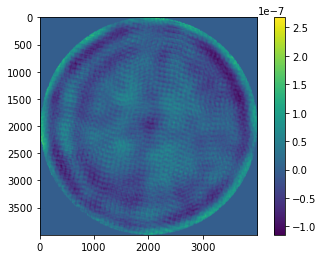

In [6]:
phaseMap = np.load('phaseMap_nm.npy')
plt.imshow(phaseMap)
plt.colorbar()

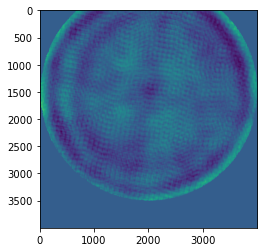

In [7]:
offset = 500
nnew_phaseMap = np.zeros((4000,4000))
nnew_phaseMap[:-offset,:] = phaseMap[offset:,:]
plt.imshow(nnew_phaseMap)



In [8]:
########################
# Define TOLIMAN pupil #
########################

toliman_Sidelobes = morphine_model.TolimanAperture(add_grating=True,grating_fact=0.0003,
                    telescope_diam=0.13, central_wav=central_wav,achromatic_pupil = True,
                    grating_amp=jnp.sqrt(0.1), pupil_file = 'Toliman_pupil.npy')

In [9]:
#######################################
# Define secondary mirror obscuration #
#######################################

trans = np.zeros((4000,4000))
y, x = np.indices((4000, 4000))
r = np.sqrt((x-4000/2)**2 + (y-4000/2)**2)
trans[r<2000*0.95] = 1
#               ^ only use inner 95% of secondary mirror
#secondary = morphine.InverseTransmission(morphine.CircularAperture(radius = 0.0071))


In [10]:
complex_optic = morphine.ArrayOpticalElement(transmission=trans,
                                          opd=phaseMap,
                                          name='Secondary Mirror')
# aperture = morphine.CompoundAnalyticOptic(opticslist = [ toliman_Sidelobes, secondary],
#                                           name = 'TOLIMAN pupil w/ secondary obscuration')

TOLIMAN = morphine.OpticalSystem()
TOLIMAN.add_pupil(toliman_Sidelobes)
#TOLIMAN.add_pupil(secondary)
TOLIMAN.add_pupil(complex_optic)
TOLIMAN.add_detector(pixelscale=pscale, fov_arcsec=pscale*num_pix/2) 

The following image is a PSF that is ideally aligned. It is used as a baseline.

CPU times: user 1min 7s, sys: 15.2 s, total: 1min 22s
Wall time: 16.7 s


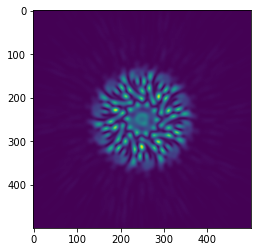

In [11]:
%%time
image_basic = get_bb_psf(0,0,TOLIMAN, wavs, weights_A)
plt.imshow(image_basic)

The following creates an optical system that offsets the secondary mirror error map, and then generates an image from this optical system. The subsequent code cell generates three images that are have the error map translated by 100 "pixels" to the left, a baseline, and then 100 "pixels" to the right. 

I have put pixels in quotes because this is not pixels on the detector. The error map was given to us as a 4000x4000 array, so a 100 "pixel" offset means translating this array to the left by 100 columns, and filling in the other side with zeros.

The secondary mirror has a diameter of $0.0142$ metres. $1/4000$th of this (one "pixel") is $3.55\times10^{-6}$ metres. The optical length is $0.3$ metres, so doing some trig:

$ \theta = atan(\frac{3.55\times10^{-6}}{0.3}) = 0^{\circ}0' 2.44" $

we find that a one pixel translation is a translation of 3.55 microns which corresponds to an angular change of 2.44 arcseconds.

In [12]:
def offset_image(offset, pixels = True):
    if pixels == False:
        print('Offsetting by angle not added yet.')
        return None

    new_phaseMap = np.zeros((4000,4000))
    
    if offset > 0:
        new_phaseMap[:,:-offset] = phaseMap[:,offset:]
    if offset < 0:
        new_phaseMap[:,-offset:] = phaseMap[:,:offset]
    if offset == 0:
        new_phaseMap = phaseMap

    new_complex_optic = morphine.ArrayOpticalElement(transmission=trans,
                                          opd=new_phaseMap,
                                          name='Secondary Mirror')
    TOLIMAN2 = morphine.OpticalSystem()
    TOLIMAN2.add_pupil(toliman_Sidelobes)
    TOLIMAN2.add_pupil(new_complex_optic)
    TOLIMAN2.add_detector(pixelscale=pscale, fov_arcsec=pscale*num_pix/2) 
    image = get_bb_psf(0,0,TOLIMAN2, wavs, weights_A)
    return image

In [13]:
image1 = offset_image(-100)
image2 = offset_image(0)
image3 = offset_image(100)

Text(0.5, 1.0, 'Residual with Baseline')

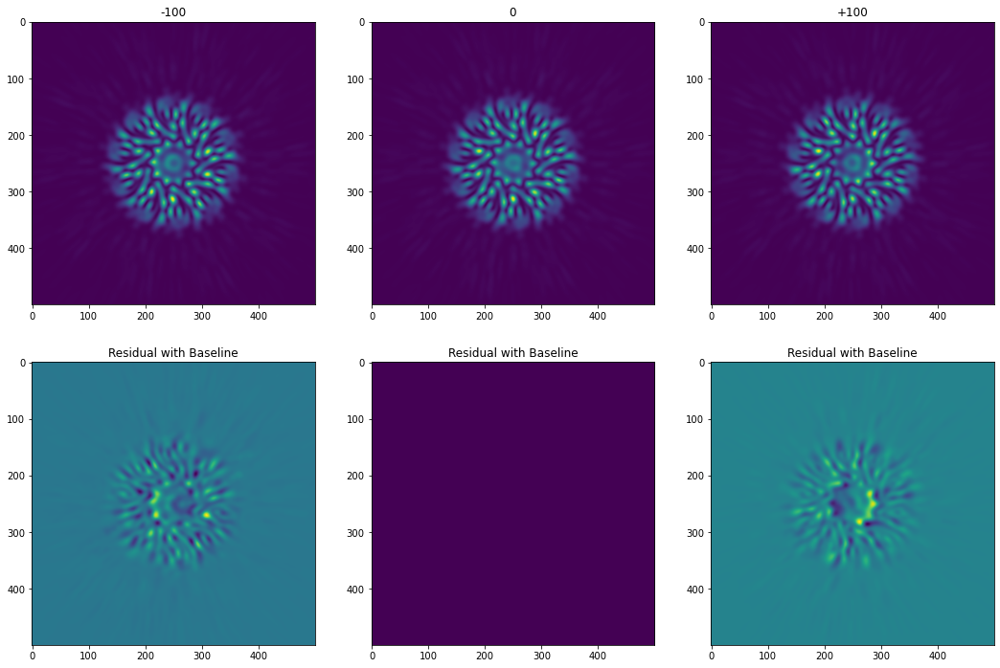

In [14]:
plt.figure(figsize = (18,12))

plt.subplot(2,3,1)
plt.imshow(image1)
plt.title('-100')

plt.subplot(2,3,2)
plt.imshow(image2)
plt.title('0')

plt.subplot(2,3,3)
plt.imshow(image3)
plt.title('+100')

plt.subplot(2,3,4)
plt.imshow(image1-image2)
plt.title('Residual with Baseline')

plt.subplot(2,3,5)
plt.imshow(image2-image2)
plt.title('Residual with Baseline')

plt.subplot(2,3,6)
plt.imshow(image3-image2)
plt.title('Residual with Baseline')

## Horizontal Offset
The following cell generates 201 images using the above code for varying offsets, however it has been commented out as the images are already generated.

In [15]:
pixel_offset = np.linspace(-100,100,201)

# for i in tqdm(range(len(pixel_offset))):
#     image = offset_image(int(pixel_offset[i]))
#     np.save('Images/Offset2/Offset_{}_pixels'.format(int(pixel_offset[i])), image)

The following code calculates the sum of square errors for each image.

In [16]:
sses_horiz = np.zeros(len(pixel_offset))
the_max_horiz = 0
the_min_horiz = 0

for i in tqdm(range(len(pixel_offset))):
    image = np.load('Images/Offset2/Offset_{}_pixels.npy'.format(int(pixel_offset[i])))
    diff = image - image_basic
    new_max = np.max(diff)
    new_min = np.min(diff)
    if new_max > the_max_horiz:
        the_max_horiz = new_max
    if new_min < the_min_horiz:
        the_min_horiz = new_min
    sse = np.sum((image - image2)**2)
    sses_horiz[i] = sse

  0%|          | 0/201 [00:00<?, ?it/s]

The following code cell generates a gif of the residuals of the horizontal displacement.

t:   5%|▌         | 7/134 [00:00<00:01, 69.24it/s, now=None]

MoviePy - Building file horiz.gif with imageio.


CPU times: user 2.92 s, sys: 250 ms, total: 3.17 s
Wall time: 2.8 s


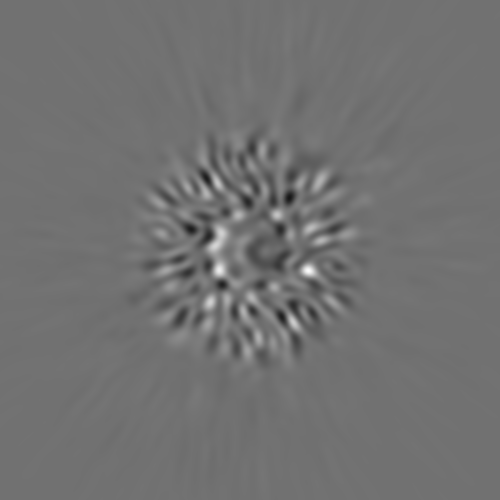

In [17]:
%%time
image_array = np.zeros((201,500,500))

for i in range(len(pixel_offset)):
    image = np.load('Images/Offset2/Offset_{}_pixels.npy'.format(int(pixel_offset[i])))
    diff = (image-image_basic)
    norm = (255*(diff - the_min_horiz)/(the_max_horiz-the_min_horiz)).astype(int)        
    image_array[i] = norm
    
image_array = image_array.reshape(201,500,500,1)

clip = ImageSequenceClip(list(image_array), fps=30)
clip.write_gif('horiz.gif', fps=20)

Image('horiz.gif')

# Vertical displacement
Essentially the same as the above cells so the following cells have been hidden. 

In [18]:
def offset_image_vert(offset, pixels = True):
    if pixels == False:
        print('Offsetting by angle not added yet.')
        return None

    new_phaseMap = np.zeros((4000,4000))
    
    if offset > 0:
        new_phaseMap[:-offset,:] = phaseMap[offset:,:]
    if offset < 0:
        new_phaseMap[-offset:,:] = phaseMap[:offset,:]
    if offset == 0:
        new_phaseMap = phaseMap

    new_complex_optic = morphine.ArrayOpticalElement(transmission=trans,
                                          opd=new_phaseMap,
                                          name='Secondary Mirror')
    TOLIMAN2 = morphine.OpticalSystem()
    TOLIMAN2.add_pupil(toliman_Sidelobes)
    TOLIMAN2.add_pupil(new_complex_optic)
    TOLIMAN2.add_detector(pixelscale=pscale, fov_arcsec=pscale*num_pix/2) 
    image = get_bb_psf(0,0,TOLIMAN2, wavs, weights_A)
    return image

In [19]:
pixel_offset = np.linspace(-100,100,201)

# for i in tqdm(range(len(pixel_offset))):
#     image = offset_image_vert(int(pixel_offset[i]))
#     np.save('Images/Offset2/Offset_vert_{}_pixels'.format(int(pixel_offset[i])), image)

In [20]:
sses_vert = np.zeros(len(pixel_offset))
the_max_vert = 0
the_min_vert = 0

for i in tqdm(range(len(pixel_offset))):
    image = np.load('Images/Offset2/Offset_vert_{}_pixels.npy'.format(int(pixel_offset[i])))
    diff = image - image_basic
    new_max = np.max(diff)
    new_min = np.min(diff)
    if new_max > the_max_vert:
        the_max_vert = new_max
    if new_min < the_min_vert:
        the_min_vert = new_min
    sse = np.sum((image - image2)**2)
    sses_vert[i] = sse
    


  0%|          | 0/201 [00:00<?, ?it/s]

In [21]:
%%time
image_array = np.zeros((201,500,500))

for i in range(len(pixel_offset)):
    image = np.load('Images/Offset2/Offset_vert_{}_pixels.npy'.format(int(pixel_offset[i])))
    diff = (image-image_basic)
    norm = (255*(diff - the_min_vert)/(the_max_vert-the_min_vert)).astype(int)        
    image_array[i] = norm
    
image_array = image_array.reshape(201,500,500,1)

clip = ImageSequenceClip(list(image_array), fps=30)
clip.write_gif('vert.gif', fps=20)



t:   5%|▌         | 7/134 [00:00<00:02, 60.20it/s, now=None]

MoviePy - Building file vert.gif with imageio.


CPU times: user 3.1 s, sys: 323 ms, total: 3.42 s
Wall time: 3.02 s


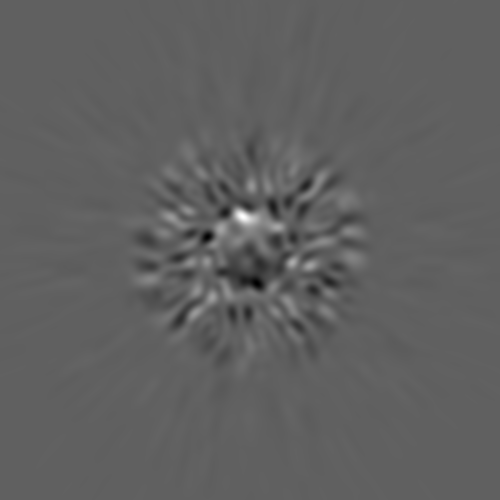

In [22]:
Image('vert.gif')

# The impacts of secondary mirror misalignment

(0.0, 8e-08)

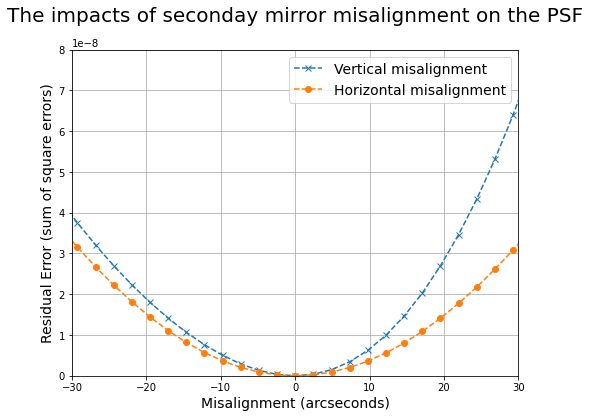

In [23]:
x_arcseconds = pixel_offset*2.44

plt.figure(figsize = (8,6))
plt.plot(x_arcseconds, sses_vert, '--x', label = 'Vertical misalignment')
plt.plot(x_arcseconds, sses_horiz, '--o', label = 'Horizontal misalignment')
plt.xlabel('Misalignment (arcseconds)', fontsize = 14)
plt.ylabel('Residual Error (sum of square errors)', fontsize = 14)
plt.legend(fontsize = 14)
plt.grid(True)
plt.title('The impacts of seconday mirror misalignment on the PSF\n', fontsize = 20)
plt.xlim([-30,30])
plt.ylim([0,0.8e-7])


Text(0.5, 1.0, 'The impacts of seconday mirror misalignment on the PSF\n')

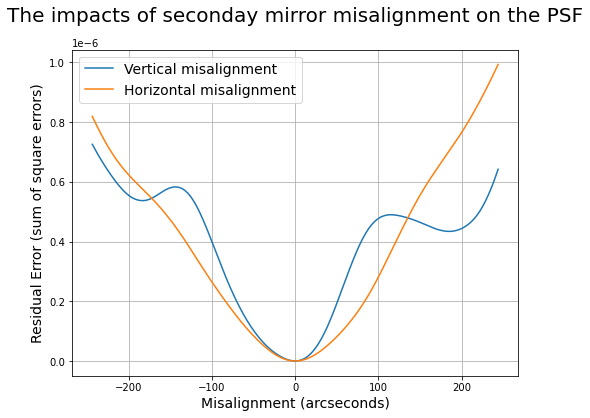

In [24]:
plt.figure(figsize = (8,6))
plt.plot(x_arcseconds, sses_vert, label = 'Vertical misalignment')
plt.plot(x_arcseconds, sses_horiz, label = 'Horizontal misalignment')
plt.xlabel('Misalignment (arcseconds)', fontsize = 14)
plt.ylabel('Residual Error (sum of square errors)', fontsize = 14)
plt.legend(fontsize = 14)
plt.grid(True)
plt.title('The impacts of seconday mirror misalignment on the PSF\n', fontsize = 20)


# Comments
I have been told that a misalignment of 10-30 arcseconds is realisitic, so only the first plot is of importance.

Note that the y-axis is more of a relative error measurement. To see the actual mission impact, we would need to see the impact of this on the forwards model. That is something I am hoping to look into in the near future.

The plots are not symmetrical, which is to be expected as the secondary mirror error map is not completely symmetrical.

The interesting feature of this is the large difference between the "vertical" misalignment and the "horizontal" misalignment. I put these words in quotations as the directions are arbritary, so here vertical is in terms of the rotation that is given in the secondary mirror error map. Anyway, the vertical error when translated "up" is more than 2x greater than the horizontal error when translated to the "right". 

I am not an expert on how optics are installed, especially for space telescope. But if there exists an axis in which an error in the placement of secondary mirror is more likely to occur, it would be good to rotate the secondary mirror such that the error this introduces on the PSF is minimised. This notebook only looks at two axis of translation - but a more thorough search should be made.